In [6]:
import os
import re
import numpy as np            
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
sc.set_figure_params(dpi=100, color_map='viridis', fontsize=6)
#sc.settings.verbosity=2
#sc.settings.n_jobs=1
#sc.logging.print_versions()

In [2]:
adata = sc.read_h5ad("new_count_umap_dim18_spread2.5_mindist0.7_celltypes_updated_last_rightname_changelow_20250804_revised.h5ad")

In [5]:
# 定义要分析的多个细胞类型
target_types = ['Rgl1-like', 'DA progenitor-FABP7', 'DA progenitor-CHRNB3 high','DA progenitor-CHRNB3 low','DA progenitor-terminal',
               'Immature DA','Mature DA']  # 替换为你的目标类型

# 提取多类别子集（保留交集基因）
adata_sub = adata[adata.obs['human_celltypes_revised'].isin(target_types), :].copy()

# 检查细胞数量分布
print(adata_sub.obs['human_celltypes_revised'].value_counts())

human_celltypes_revised
DA progenitor-FABP7          4886
DA progenitor-terminal       1641
Rgl1-like                    1076
DA progenitor-CHRNB3 low      957
DA progenitor-CHRNB3 high     865
Immature DA                   756
Mature DA                     132
Name: count, dtype: int64


<Axes: title={'center': 'human_celltypes_revised'}, xlabel='UMAP1', ylabel='UMAP2'>

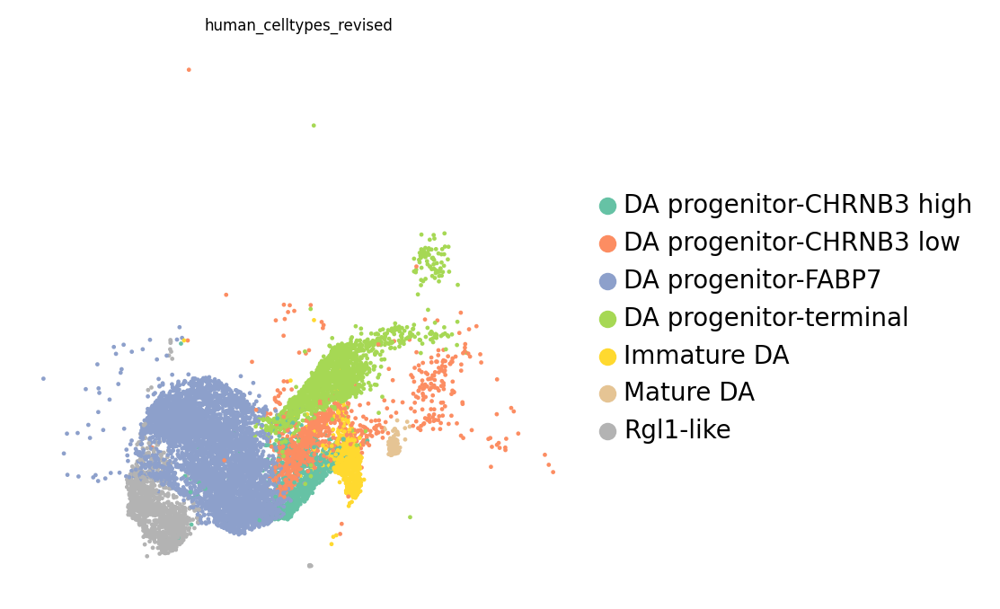

In [7]:
 sc.pl.umap(
        adata_sub,
        color='human_celltypes_revised',
        palette='Set2',
        legend_fontsize=10,
        legend_fontoutline=2,
        frameon=False,
        show=False  # 避免自动显示，便于批量保存
    )
    

In [8]:
import itertools  # 用于生成参数组合

# 定义待测试的参数范围
n_pcs_list = list(range(20, 40))        # 测试不同的 n_pcs 值
n_neighbors_list = list(range(13, 25,1))
#min_dist_list = np.round(np.arange(0.1, 1.1, 0.2),1)  # UMAP 的 min_dist 参数
#spread_list = np.round(np.arange(0.5, 3, 0.5),1)   # UMAP 的 spread 参数

# 遍历所有参数组合
for n_pcs, n_neighbors in itertools.product(n_pcs_list, n_neighbors_list):
#for random_state in random_states:
    # 复制原始数据，避免覆盖原有结果
    adata_temp = adata_sub.copy()
    # Step 1: 计算邻居图（使用当前 n_pcs）
    sc.pp.neighbors(
        adata_temp,
        n_neighbors=n_neighbors,
        n_pcs=n_pcs,
        use_rep='X_integrated.rpca',  # 确保使用已校正的 PCA
        random_state=18
    )
    
    # Step 2: 计算 UMAP（应用当前 min_dist 和 spread）
    sc.tl.umap(
        adata_temp,
        min_dist=1.0,
        spread=0.5,
        random_state=18
    )
    
    # Step 3: 绘制 UMAP 图并标注参数
    sc.pl.umap(
        adata_temp,
        color='human_celltypes_revised',
        palette='Set2',
        title=f'n_neighbors={n_neighbors},n_pcs={n_pcs},min_dist=1.0,spread=0.5',  # 标题显示参数
        legend_fontsize=10,
        legend_fontoutline=2,
        frameon=False,
        show=False  # 避免自动显示，便于批量保存
    )
    
    # 可选：保存图片到文件
    plt.savefig(f'./umap_figure_1/UMAP_n_pcs_{n_pcs}_n_neighbors_{n_neighbors}_spread_0.5_min_dist_1.0.png', dpi=300, bbox_inches='tight')
    plt.close()  # 关闭当前图像，释放内存

/home/liuxiaodongLab/jiangjing/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
n_neighbors=13
n_pcs=34
min_dist=1.0
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca', # 明确指定使用校正后的PCA
    random_state=18
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread,random_state=18)
sc.pl.umap(
       adata_sub,
       color='human_celltypes_revised',
       palette='Set2',
       #legend_loc='on data',
       show=False,
       frameon=False,
       title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
   )

<Axes: title={'center': 'n_neighbors=13,n_pcs=34, min_dist=1.0, spread=0.5'}, xlabel='UMAP1', ylabel='UMAP2'>

In [11]:
adata_sub.write("scanpy_UMAP_n_neighbors13_npcs34_mindist1.0_spread0.5.h5ad")

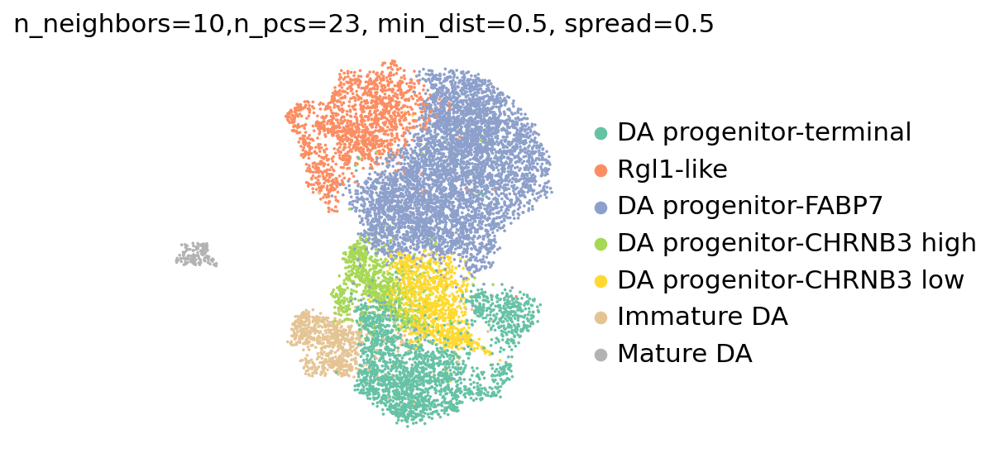

In [30]:
# 将目标聚类名称替换为你的实际聚类名称，例如 "Oligodendrocytes"
target_cluster = "DA progenitor-terminal"  

# 获取当前分类顺序
categories = adata_sub.obs['human_celltypes_250418'].cat.categories.tolist()

# 将目标聚类移动到列表最前面
categories.insert(0, categories.pop(categories.index(target_cluster)))

# 重新设置分类顺序
adata_sub.obs['human_celltypes_250418'] = adata_sub.obs['human_celltypes_250418'].cat.reorder_categories(categories)

sc.pl.umap(
    adata_sub,
    color='human_celltypes_250418',
    palette='Set2',
    show=True,
    frameon=False,
    sort_order=True,
    title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
    save=f'UMAP_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
)


In [14]:
import scipy
# 检查是否存在 "counts" 的 layer
if "counts" in adata_sub.layers:
    counts_matrix = adata_sub.layers["counts"]
    
    # 处理稀疏矩阵：如果是稀疏格式，需转换为密集数组（注意内存问题）
    if isinstance(counts_matrix, scipy.sparse.spmatrix):
        counts_matrix = counts_matrix.toarray()
    
    # 创建 DataFrame（行为细胞，列为基因）
    df_counts = pd.DataFrame(
        counts_matrix,
        index=adata_sub.obs_names,  # 行名 = 细胞 ID
        columns=adata_sub.var_names  # 列名 = 基因名
    )
    
    # 转置矩阵，使得行是基因，列是细胞（根据常见表达矩阵格式要求）
    df_counts = df_counts.T
    
    # 导出为文件
    df_counts.to_csv("./expression_matrix_counts.txt", sep='\t', index=True, header=True)
else:
    print("Warning: adata.layers['counts'] not found. Falling back to adata.X.")
    # 备用方案：使用默认的 adata.X
    pd.DataFrame(
        adata_sub.X.toarray() if scipy.sparse.issparse(adata_sub.X) else adata_sub.X,
        index=adata_sub.obs_names,
        columns=adata_sub.var_names
    ).T.to_csv("./expression_matrix_X.txt", sep='\t', index=True, header=True)


# 导出 UMAP 坐标
pd.DataFrame(adata_sub.obsm['X_umap'], 
             index=adata_sub.obs_names, 
             columns=['UMAP1', 'UMAP2']).to_csv("./umap_coordinates.txt", sep='\t', index=True, header=True)

# 导出细胞注释信息
adata_sub.obs[['human_celltypes_revised']].to_csv("./cell_metadata.txt", sep='\t', index=True, header=True)

# 导出校正后的 PCA 坐标（可选）
pd.DataFrame(adata_sub.obsm['X_integrated.rpca'], 
             index=adata_sub.obs_names).to_csv("./integrated_pca.txt", sep='\t', index=True, header=True)

In [32]:
# 导出 UMAP 坐标
pd.DataFrame(adata_sub.obsm['X_umap'], 
             index=adata_sub.obs_names, 
             columns=['UMAP1', 'UMAP2']).to_csv("umap_coordinates.csv")

# 导出细胞注释信息
adata_sub.obs[['human_celltypes_revised']].to_csv("cell_metadata.csv")

# 导出校正后的 PCA 坐标（可选）
pd.DataFrame(adata_sub.obsm['X_integrated.rpca'], 
             index=adata_sub.obs_names).to_csv("integrated_pca.csv")

cytotrace2: Loading dataset
cytotrace2: Dataset characteristics
    Number of input genes: 24190
    Number of input cells: 10313
cytotrace2: Input parameters
    Input file: expression_matrix_X.txt
    Species: human
    Parallelization enabled: True
    Batch size: 20000
    Smoothing batch size: 1000
    Seed: 14
    Output directory: cytotrace2_results
    Plotting enabled: True
    Verbose mode enabled: True
    User-provided limit for number of cores to use: None
       ...64 cores detected. CytoTRACE 2 will run using up to 32/64 cores.
cytotrace2: Loading dataset
cytotrace2: Dataset characteristics
    Number of input genes:  24190
    Number of input cells:  10313
cytotrace2: Checking models...
All model files are present.


/home/liuxiaodongLab/jiangjing/miniconda3/envs/diffusionmap/lib/python3.9/site-packages/cytotrace2_py/cytotrace2_py.py:146: UserWarning: Input expression data seem to be log2-transformed. Please provide data as raw counts or CPM/TPM.
  warnings.warn("Input expression data seem to be log2-transformed. Please provide data as raw counts or CPM/TPM.",stacklevel=1)


cytotrace2: Computing UMAP embeddings from full expression
cytotrace2: The passed batch_size is greater than the number of cells in the subsample. 
    Now setting batch_size to 10313.
cytotrace2: Preprocessing
cytotrace2: Running 1 prediction batch(es) sequentially using 20 cores per batch.
cytotrace2: Initiated processing batch 1/1 with 10313 cells
    Mapped 13933 input gene names to mouse orthologs
    13932 input genes are present in the model features.
cytotrace2: Performing initial model prediction
cytotrace2: Performing smoothing by diffusion
cytotrace2: Performing smoothing by adaptive KNN
cytotrace2: Plotting outputs


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

cytotrace2: Finished.


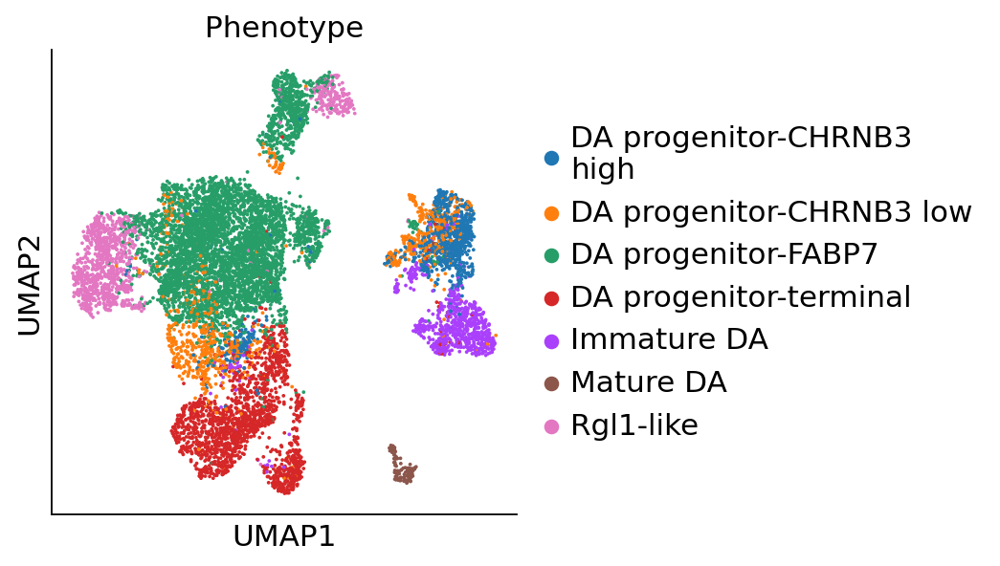

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

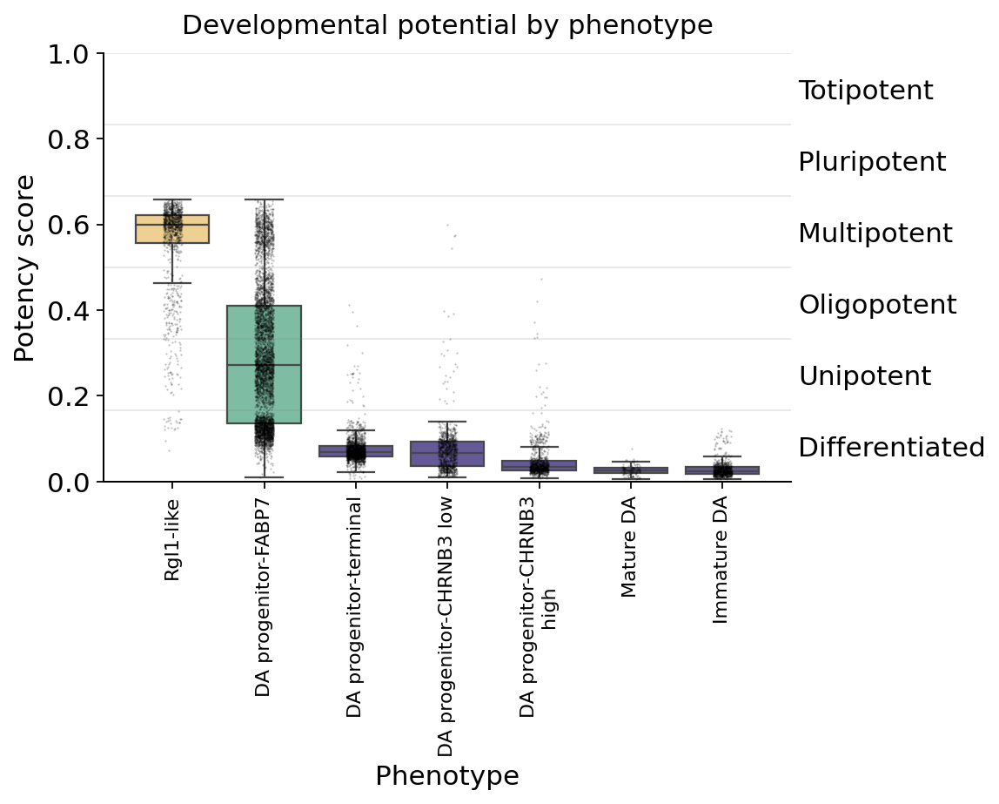

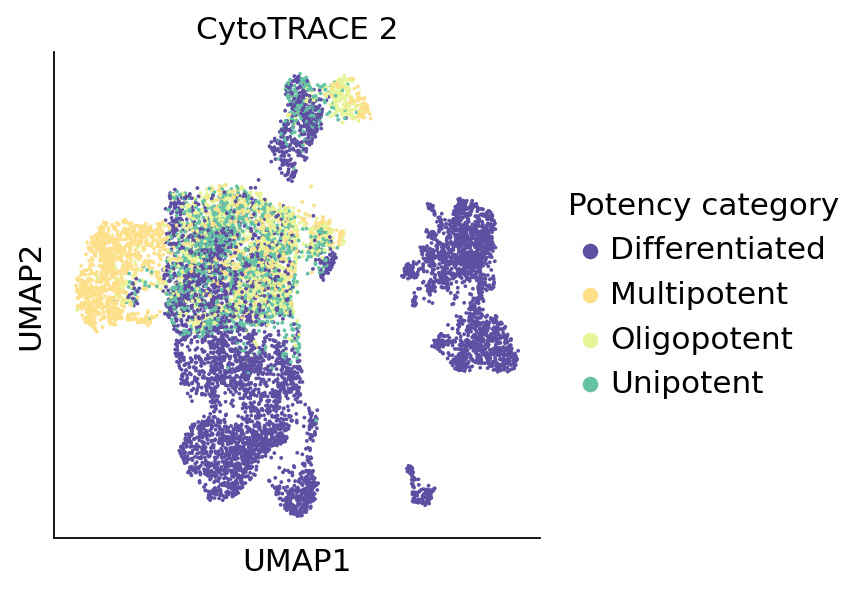

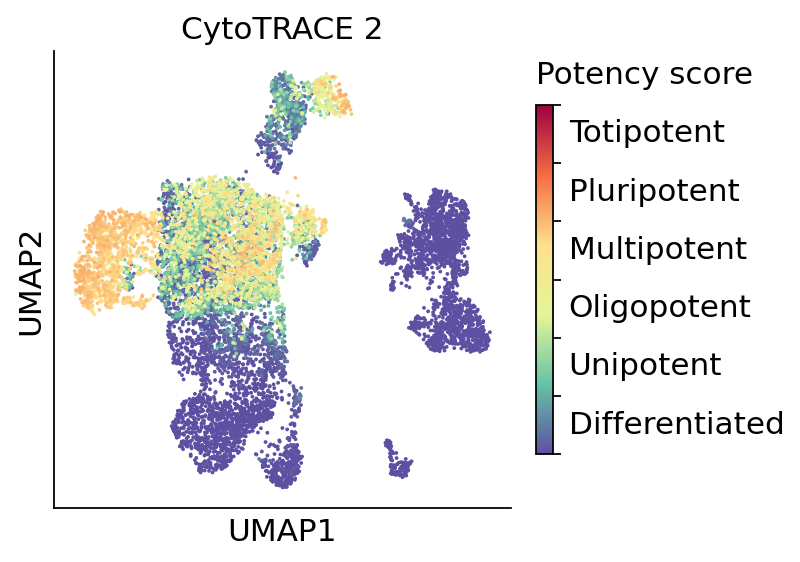

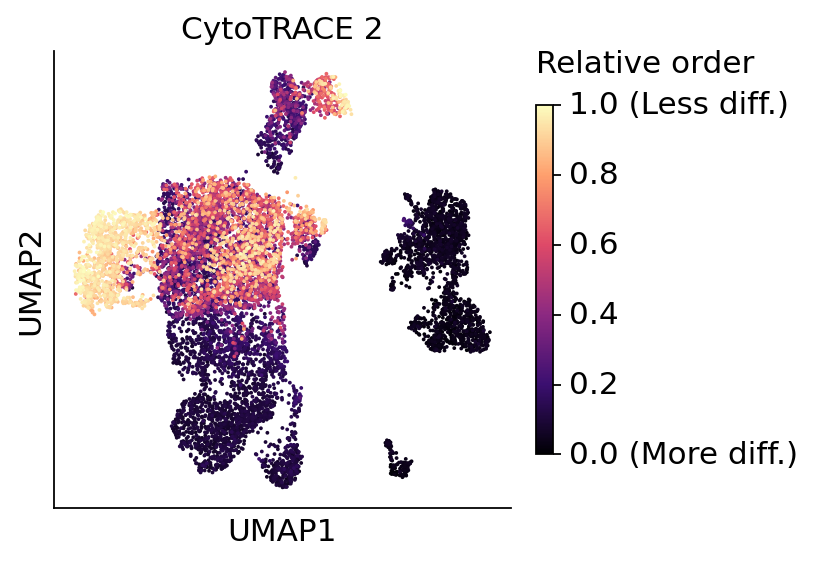

In [15]:
from cytotrace2_py.cytotrace2_py import *

input_path = "expression_matrix_X.txt"
example_annotation_path = "cell_metadata.txt"
example_species = "human"
#precomputed_umap = pd.read_csv('umap_coordinates.csv', index_col=0)

results =  cytotrace2(input_path,
                     annotation_path=example_annotation_path,
                     species=example_species,
                     #existing_umap=precomputed_umap
                     #disable_parallelization=True,
                     #disable_plotting=True
                     )

In [7]:
results

,CytoTRACE2_Score,CytoTRACE2_Potency,CytoTRACE2_Relative,preKNN_CytoTRACE2_Score,preKNN_CytoTRACE2_Potency
rat12M_A_CTCCTCCAGCTGCCTG-1,0.021576,Differentiated,0.027215,0.016722,Differentiated
rat12M_A_CAGGCCACATTGTTGG-1,0.014729,Differentiated,0.016776,0.016929,Differentiated
rat12M_A_CTGTCGTGTGAGCGAT-1,0.031919,Differentiated,0.042984,0.029151,Differentiated
rat12M_A_GTTACCCGTTGATGTC-1,0.024636,Differentiated,0.031880,0.010962,Differentiated
rat12M_A_CGGGACTGTCAGGAGT-1,0.035931,Differentiated,0.049101,0.025930,Differentiated
...,...,...,...,...,...
P1B_CAGCGTGCACTGCATA-1,0.091537,Differentiated,0.133881,0.117036,Differentiated
P1B_GAAATGAGTTGTCATG-1,0.647889,Multipotent,0.982126,0.659166,Multipotent
P1B_ATCAGGTCATTGCAGT-1,0.123250,Differentiated,0.182233,0.115281,Differentiated
P1B_CTCATTAAGCATTTAC-1,0.104179,Differentiated,0.153156,0.114724,Differentiated


In [16]:
# 确保索引与 adata_sub 完全一致
results = results.reindex(adata_sub.obs_names)

# 将各列添加到 adata_sub 的 obs 中
adata_sub.obs = pd.concat([adata_sub.obs, results], axis=1)

In [25]:
adata_sub.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.1,RNA_snn_res.0.2,RNA_snn_res.0.3,RNA_snn_res.0.4,RNA_snn_res.0.5,RNA_snn_res.0.6,...,human_celltypes_250416,human_celltypes_250418,orig.cell.names,subcluster_low,human_celltypes_250630,CytoTRACE2_Score,CytoTRACE2_Potency,CytoTRACE2_Relative,preKNN_CytoTRACE2_Score,preKNN_CytoTRACE2_Potency
rat12M_A_CTCCTCCAGCTGCCTG-1,rat12M_A,10659.0,4900.0,0.189873,1,3,13,5,21,20,...,Immature DA,Immature DA,rat12M_A_CELL202_N1,-2147483648,Immature DA,0.017276,Differentiated,0.016289,0.002533,Differentiated
rat12M_A_CAGGCCACATTGTTGG-1,rat12M_A,22573.0,6803.0,0.495028,1,3,13,5,11,12,...,DA progenitor-CHRNA6 high,DA progenitor-CHRNB3 high,rat12M_A_CELL284_N3,-2147483648,DA progenitor-CHRNB3 high,0.036372,Differentiated,0.045451,0.006831,Differentiated
rat12M_A_CTGTCGTGTGAGCGAT-1,rat12M_A,20958.0,6921.0,0.036770,1,3,13,5,11,12,...,DA progenitor-CHRNA6 high,DA progenitor-CHRNB3 high,rat12M_A_CELL418_N2,-2147483648,DA progenitor-CHRNB3 high,0.028464,Differentiated,0.033374,0.030040,Differentiated
rat12M_A_GTTACCCGTTGATGTC-1,rat12M_A,20339.0,6916.0,0.177396,1,3,13,5,21,20,...,DA progenitor-CHRNA6 high,DA progenitor-CHRNB3 high,rat12M_A_CELL494_N2,-2147483648,DA progenitor-CHRNB3 high,0.039069,Differentiated,0.049569,0.059672,Differentiated
rat12M_A_CGGGACTGTCAGGAGT-1,rat12M_A,20612.0,6628.0,0.056649,1,3,13,5,21,20,...,Immature DA,Immature DA,rat12M_A_CELL678_N1,-2147483648,Immature DA,0.023241,Differentiated,0.025397,0.009252,Differentiated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P1B_CAGCGTGCACTGCATA-1,SeuratProject,6576.0,3003.0,3.443158,1,3,12,13,13,11,...,DA progenitor-terminal,DA progenitor-terminal,NaN,-2147483648,DA progenitor-terminal,0.123277,Differentiated,0.178162,0.161057,Differentiated
P1B_GAAATGAGTTGTCATG-1,SeuratProject,11968.0,4997.0,3.083306,1,0,10,11,14,15,...,Rgl1-like,Rgl1-like,NaN,-2147483648,Rgl1-like,0.638091,Multipotent,0.964328,0.656873,Multipotent
P1B_ATCAGGTCATTGCAGT-1,SeuratProject,7269.0,3317.0,3.226238,1,0,0,0,0,0,...,DA progenitor-FABP7,DA progenitor-FABP7,NaN,-2147483648,DA progenitor-FABP7,0.141204,Differentiated,0.205538,0.137238,Differentiated
P1B_CTCATTAAGCATTTAC-1,SeuratProject,3150.0,1852.0,7.960644,1,0,0,0,0,0,...,DA progenitor-FABP7,DA progenitor-FABP7,NaN,-2147483648,DA progenitor-FABP7,0.128969,Differentiated,0.186854,0.138007,Differentiated


/home/liuxiaodongLab/jiangjing/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


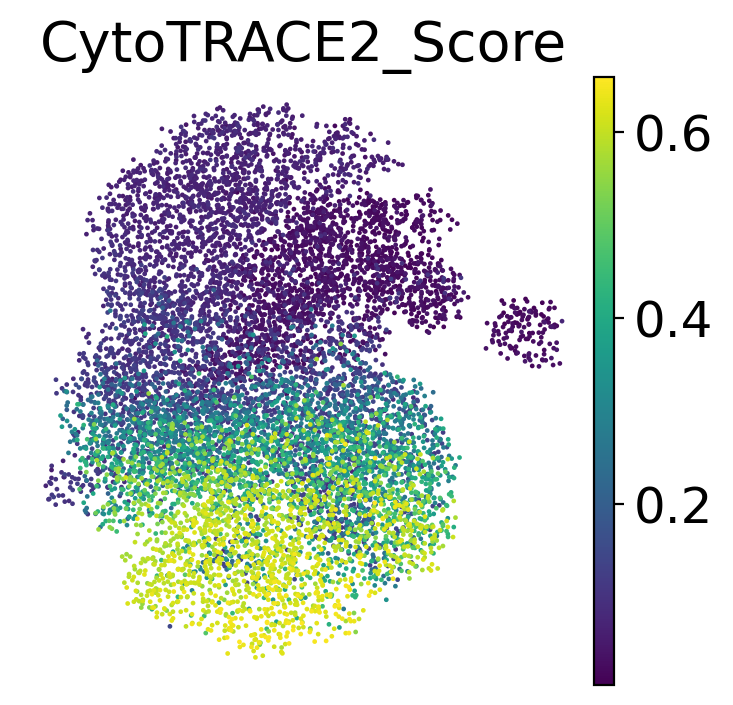

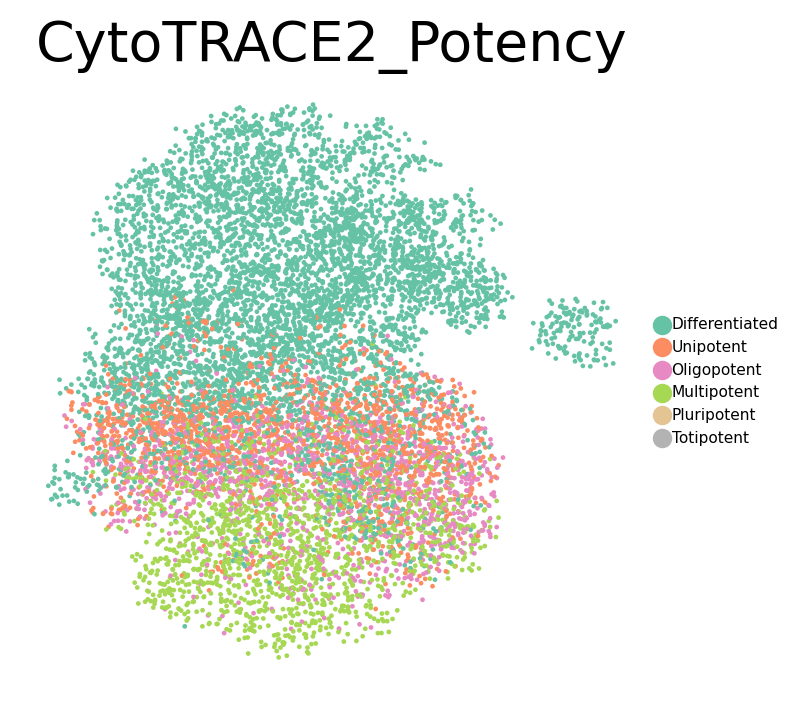

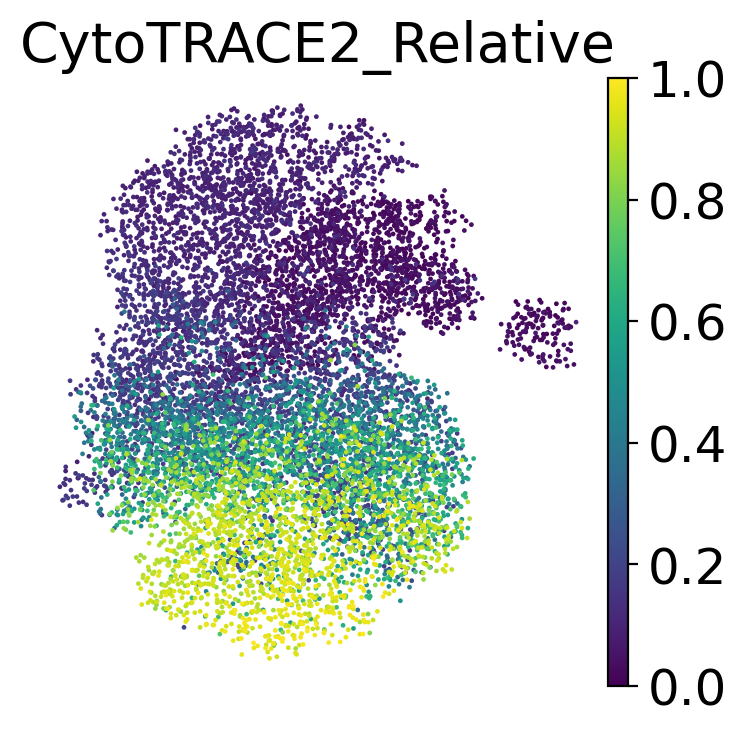

In [5]:
n_neighbors=13
n_pcs=34
min_dist=1.0
spread=0.5

sc.pp.neighbors(
    adata_sub, 
    n_neighbors=n_neighbors, 
    n_pcs=n_pcs,  # 使用校正后的前30个PC
    use_rep='X_integrated.rpca', # 明确指定使用校正后的PCA
    random_state=18
)
sc.tl.umap(adata_sub, min_dist=min_dist,spread=spread,random_state=18)
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Score',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Score_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
   )
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Potency',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Potency_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
   )
sc.pl.umap(
       adata_sub,
       color='CytoTRACE2_Relative',
       palette='Set2',
       show=True,
       frameon=False,
      # title=f'n_neighbors={n_neighbors},n_pcs={n_pcs}, min_dist={min_dist}, spread={spread}',
       save=f'UMAP_cytotrace2_Relative_n_neighbors{n_neighbors}_npcs{n_pcs}_mindist{min_dist}_spread{spread}.pdf'
   )

In [34]:
adata_sub.obsm['X_umap']

array([[2.9677465 , 6.4470377 ],
       [0.2503904 , 5.866025  ],
       [1.8439579 , 7.384107  ],
       ...,
       [0.96041155, 2.2174935 ],
       [1.2186587 , 1.9254843 ],
       [1.3936663 , 1.201728  ]], dtype=float32)

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 设置全局字体大小
plt.rcParams.update({
    'font.size': 18,          # 全局字体大小
    'axes.titlesize': 20,     # 标题字体大小
    'axes.labelsize': 18,     # 坐标轴标签字体大小
    'xtick.labelsize': 18,    # x轴刻度标签字体大小
    'ytick.labelsize': 18,    # y轴刻度标签字体大小
})

# 创建画布
plt.figure(figsize=(15, 10))

# 提取 UMAP 坐标并合并到 obs
umap_coords = pd.DataFrame(
    adata_sub.obsm['X_umap'], 
    columns=['UMAP2', 'UMAP3'], 
    index=adata_sub.obs_names
)
df = adata_sub.obs.join(umap_coords)

# 按中位数排序细胞类型（推荐方式）
sorted_categories = df.groupby("human_celltypes_revised")["CytoTRACE2_Score"] \
                     .median() \
                     .sort_values(ascending=False) \
                     .index.tolist()

# 绘制箱线图
sns.boxplot(
    data=df,
    x="human_celltypes_revised",
    y="CytoTRACE2_Score",
    palette="Pastel1",
    order=sorted_categories
)

# 设置标题和坐标轴标签
plt.title("CytoTRACE2 Potency Score by Phenotype", fontsize=18)
plt.xlabel("", fontsize=14)
plt.ylabel("", fontsize=14)

# 旋转 x 轴标签以避免重叠，右对齐
plt.xticks(rotation=45, ha='right', fontsize=12)

# 自动调整子图参数以适应图像
plt.tight_layout()

# 显示图像或保存
#plt.show()
plt.savefig("cytotrace2_potency_score_by_phenotype.pdf", dpi=300, bbox_inches='tight')
plt.close()

/tmp/ipykernel_859591/801092049.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sorted_categories = df.groupby("human_celltypes_revised")["CytoTRACE2_Score"] \
/tmp/ipykernel_859591/801092049.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


In [19]:
adata_sub.write("scanpy_UMAP_n_neighbors13_npcs34_mindist1.0_spread0.5_cytotrace2.h5ad")

In [2]:
adata_sub=sc.read_h5ad("scanpy_UMAP_n_neighbors13_npcs34_mindist1.0_spread0.5_cytotrace2_copy.h5ad")

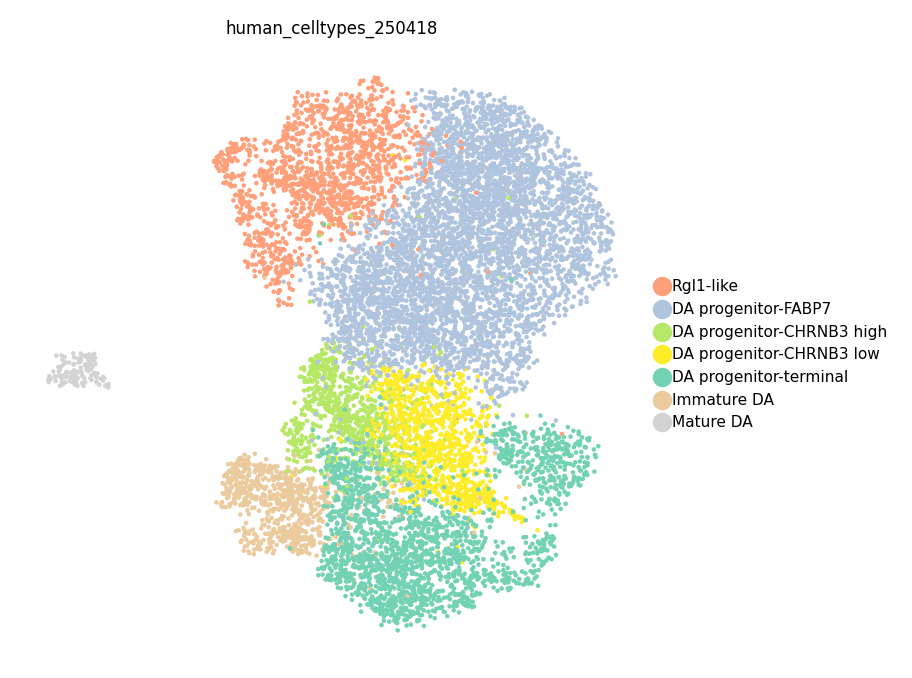

In [19]:
# 定义自定义颜色调色板
custom_palette = ['#FFA07A', '#B0C4DE', '#B6E765', '#FFEC29', '#74D2B4', '#EBCB9D', '#D3D3D3']

# 使用自定义颜色调色板绘制UMAP图
sc.pl.umap(
    adata_sub,
    color='human_celltypes_revised',
    palette=custom_palette,
    show=True,
    frameon=False,
    sort_order=True
)

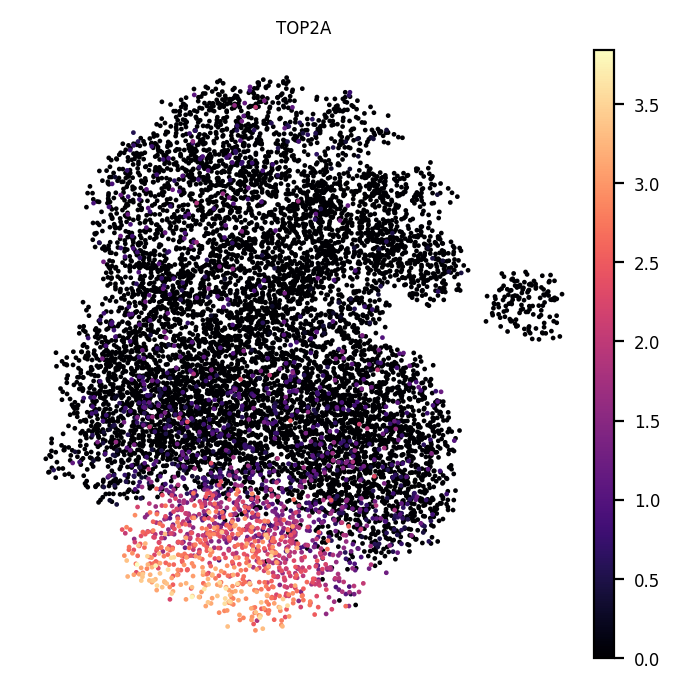

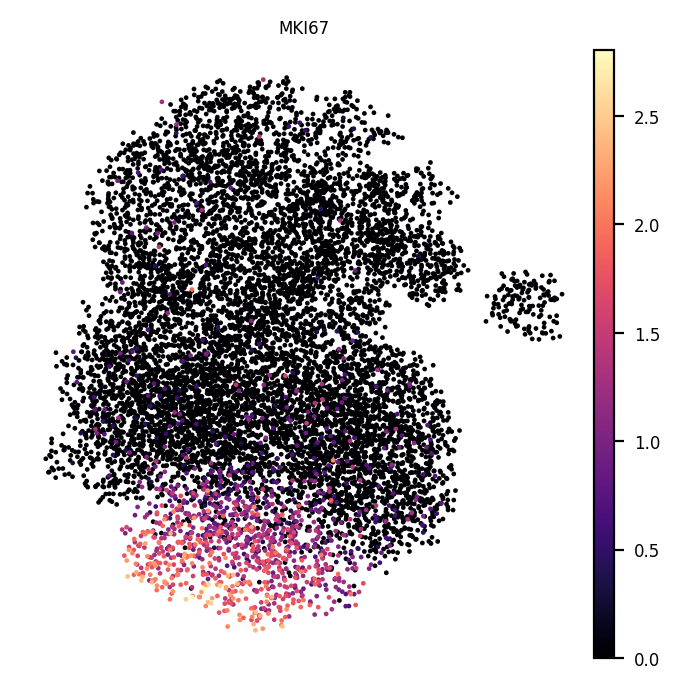

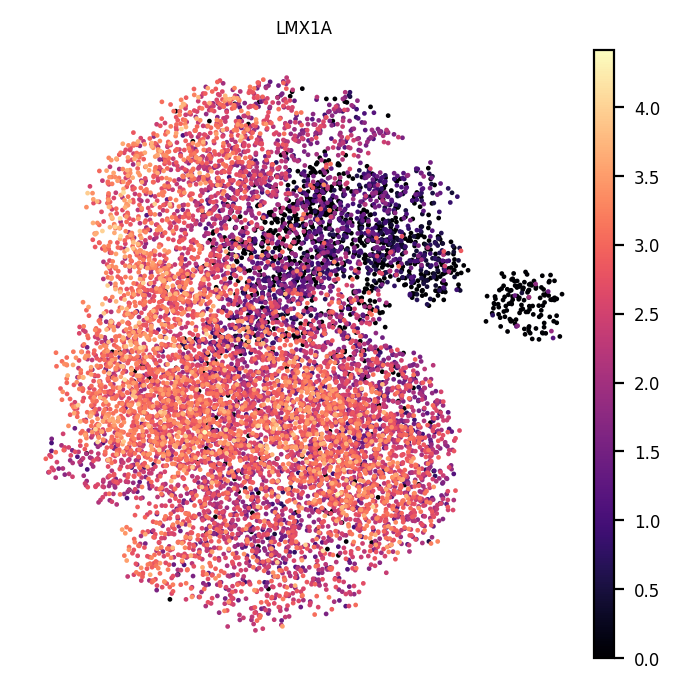

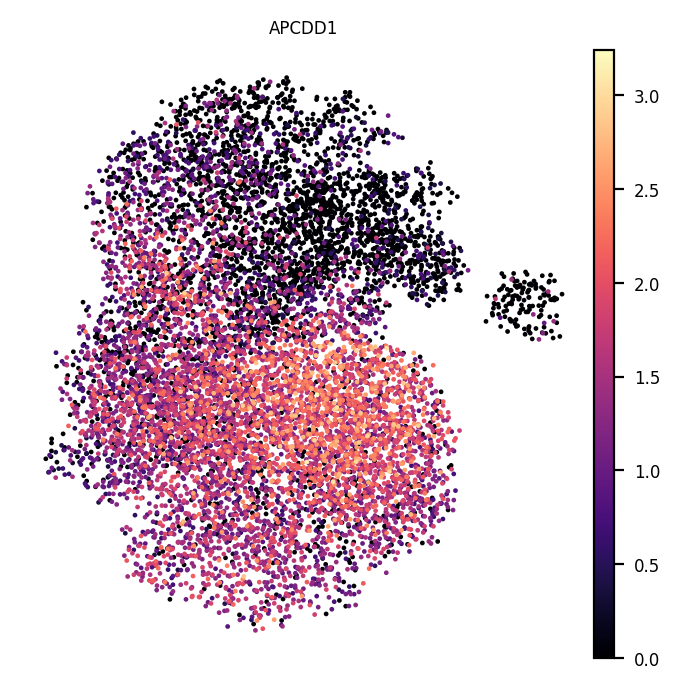

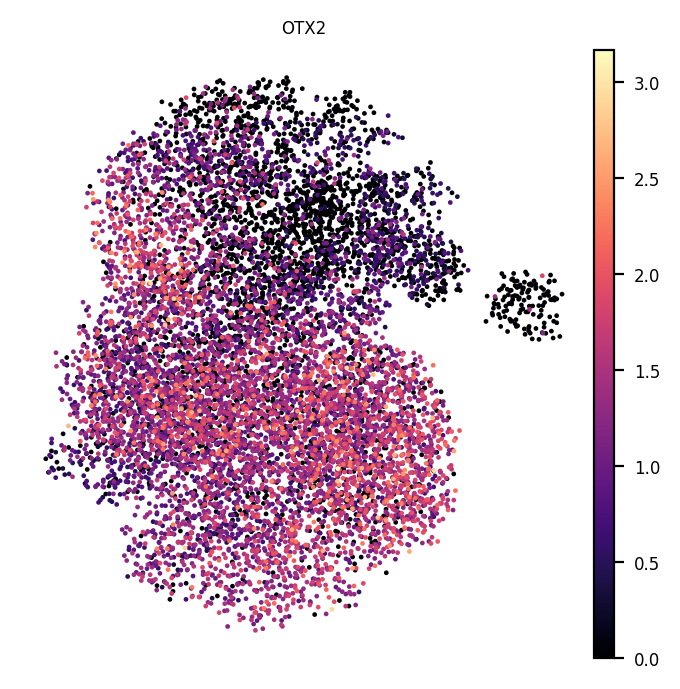

...

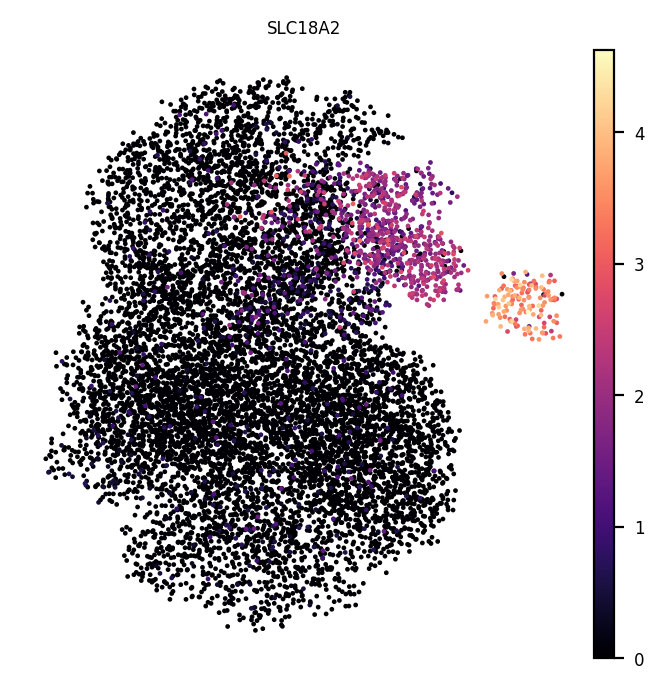

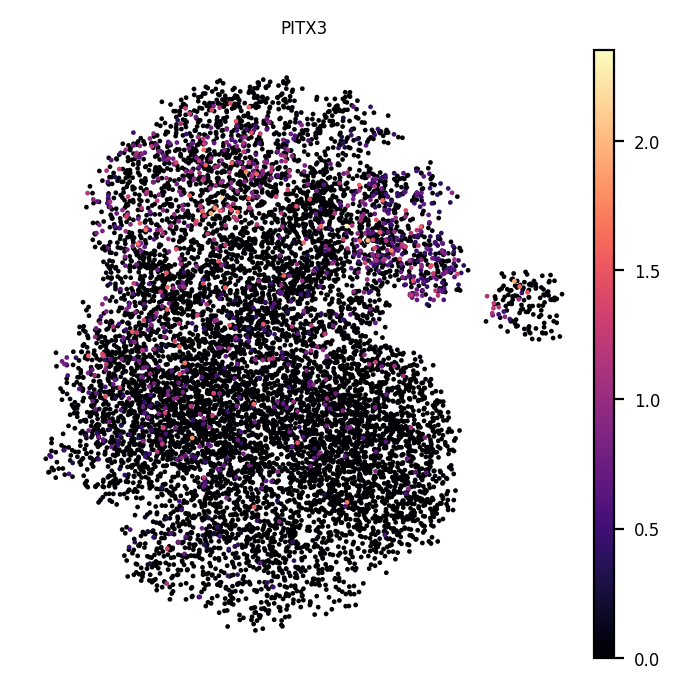

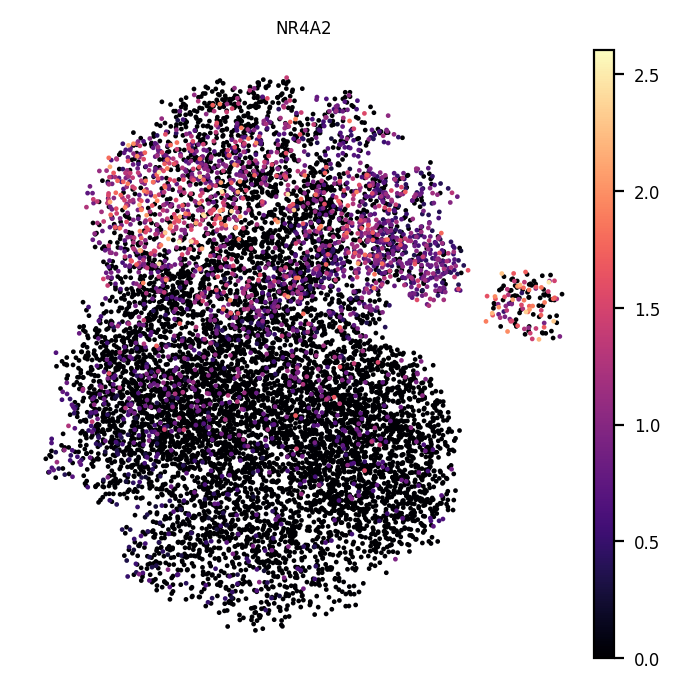

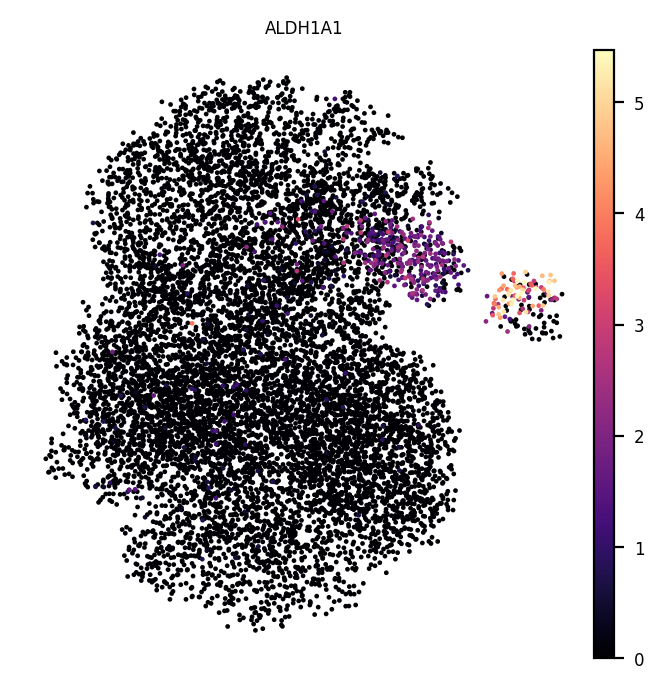

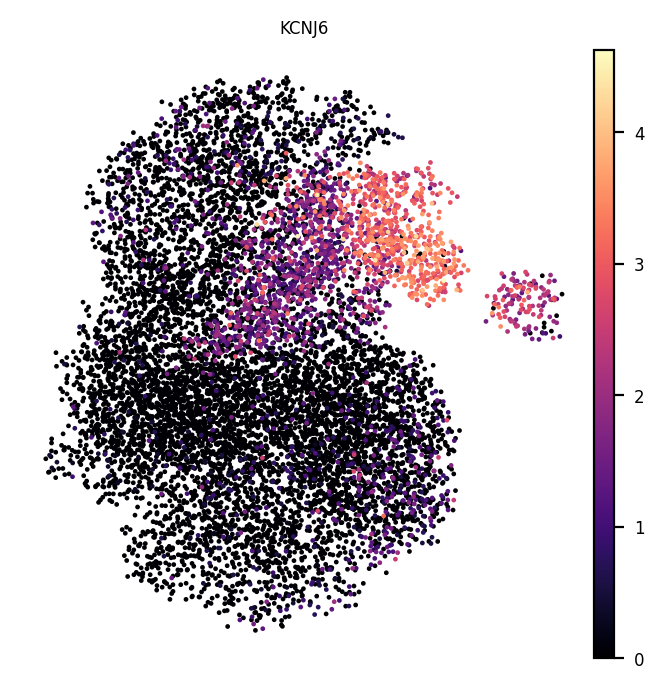

In [7]:
gene_lists=["top2a","mki67","Lmx1a","Apcdd1","OTX2","TTR","FABP7","CHRNA6","CHRNB3","DDC","ASCL1","EN1",
            "KCNJ6","TH","SLC6A3","SLC18A2","PITX3","NR4A2","ALDH1A1","KCNJ6"]
gene_lists = [gene.upper() for gene in gene_lists]  # 全大写
for gene in gene_lists:
    sc.pl.umap(adata_sub, color=gene, show=True, frameon=False,cmap='magma',save=f'umap_gene_{gene}_expression.pdf')